In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
df = pd.read_csv("../data/original/train_transaction.csv")

In [4]:
df2 = pd.read_csv("../data/original/train_identity.csv")

In [5]:
def viz_count_mean(df, group, save_path=None):
    df_viz = df.groupby(group).agg({"isFraud": ["count", "mean"]}).reset_index()
    df_viz.columns = [group, "count", "mean"]

    fig, ax1 = plt.subplots(figsize=(15, 6))
    ax1.bar(df_viz[group].drop_duplicates().astype(str), df_viz["count"], label="count", color="blue", alpha=0.5)
    plt.legend()
    ax2 = ax1.twinx()
    ax2.plot(df_viz[group].drop_duplicates().astype(str), df_viz["mean"], label="isFraud", color="green", alpha=0.5)
    ax2.hlines(0.0349, color="red", xmin=-1, xmax=len(df_viz), linestyles="dashed", label="isFraud_MEAN")
    ax2.set_ylim([0, 0.2])
    plt.title(group)
    plt.legend()
    if save_path is not None:
        plt.savefig("{}/viz_count_mean/{}.png".format(save_path, group))
    plt.show()

# まとめ
* D1 zeroが不良率高め(0.04), mod7=0不良率低め
* D2 nan/0は他より不良率高い(0.05くらい)
* D3 D2と分布が似てる かつ D2mod7==D3mod7が多い　→　前回取引日と今回取引日的なかんじ！？
* D4
* D5
* D6
* D7
* D8
* D9
* D10
* D11 nanは不良率高め
* D12
* D13
* D14
* D15

In [21]:
len(bins)

11

In [25]:
_, bins = pd.cut(df["D1"], 10, retbins=True)
pd.cut(df["D1"], 10, labels=bins[:-1]).astype(float)

0         -0.64
1         -0.64
2         -0.64
3         64.00
4         -0.64
          ...  
590535    -0.64
590536    -0.64
590537    -0.64
590538    -0.64
590539    -0.64
Name: D1, Length: 590540, dtype: float64

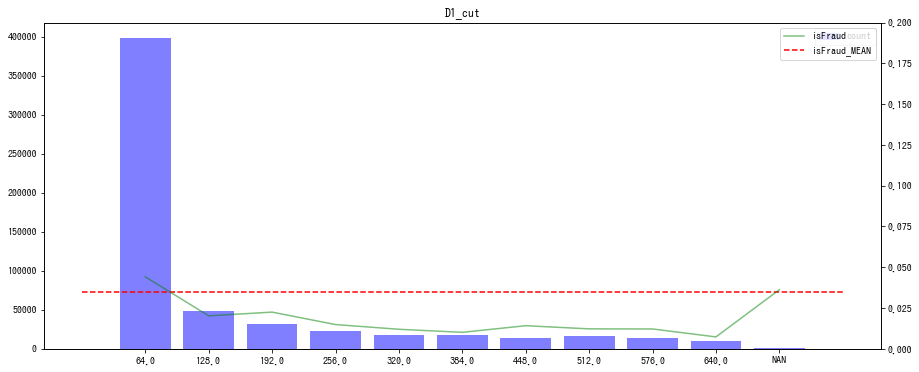

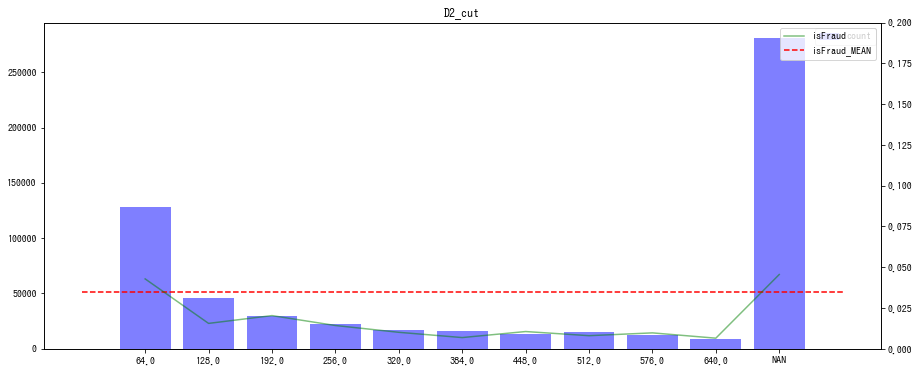

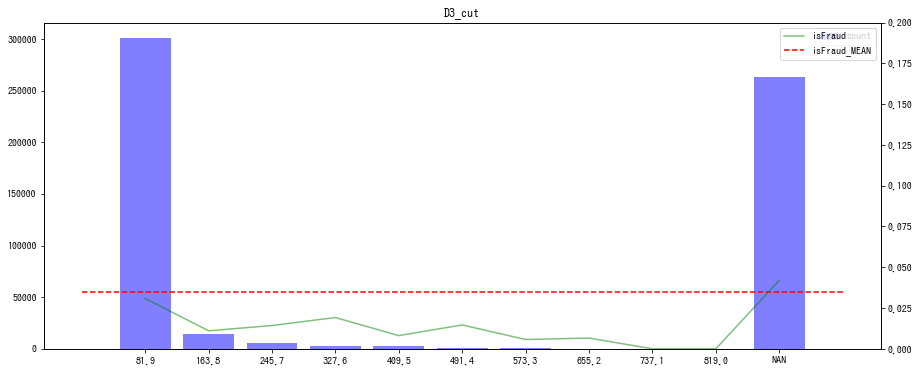

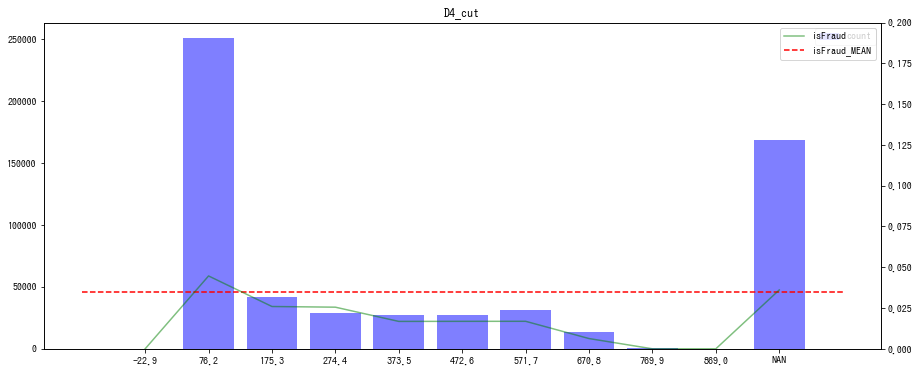

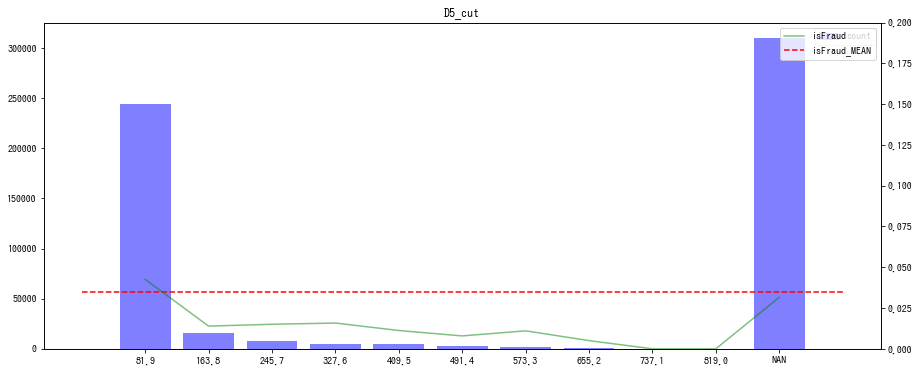

...

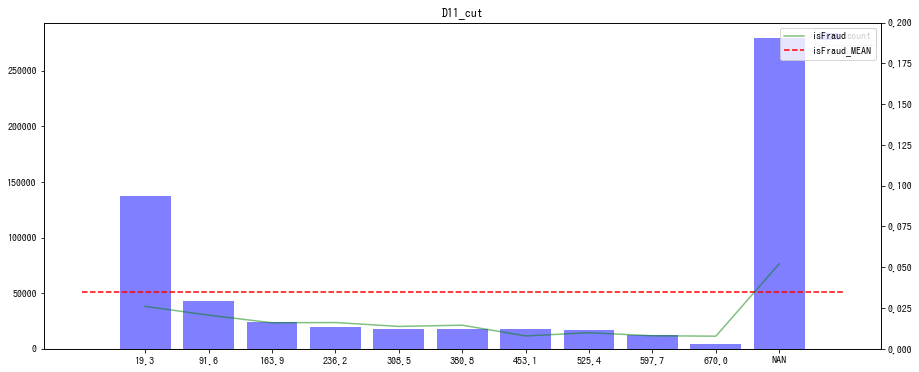

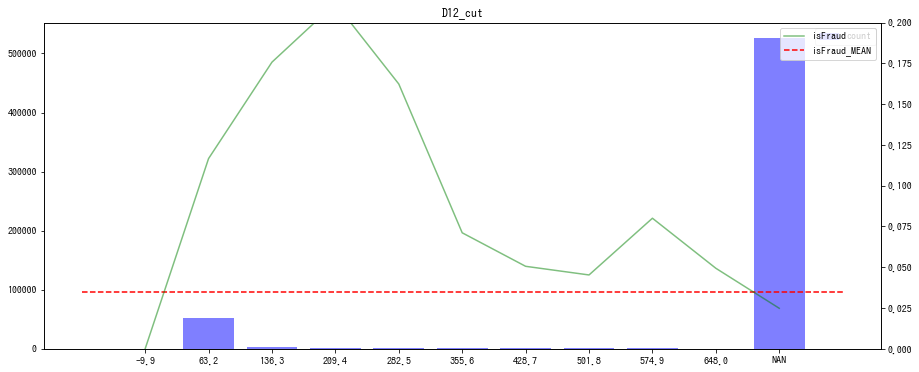

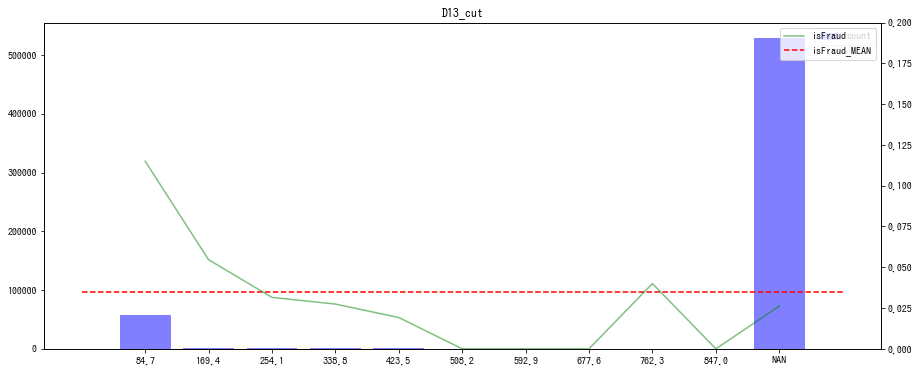

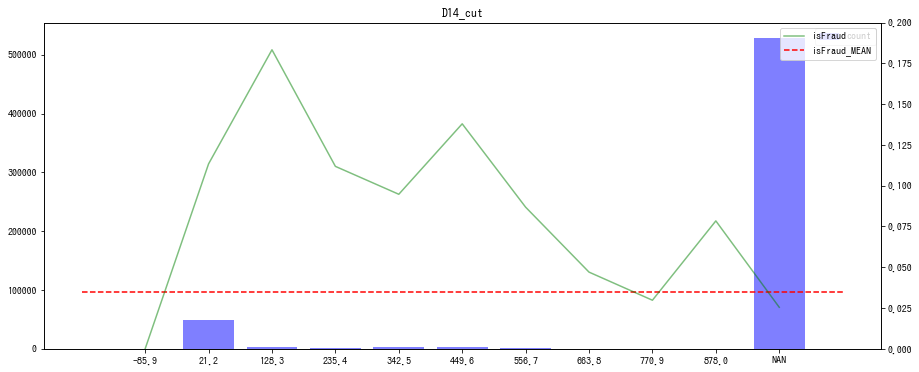

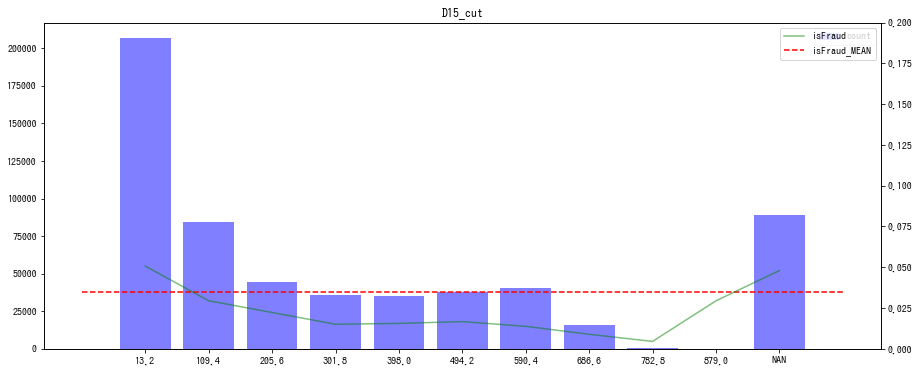

In [28]:
for col in df[["D{}".format(x) for x in range(1, 15+1)]]:
    _, bins = pd.cut(df[col], 10, retbins=True) # binの名前を数値にする
    df["{}_cut".format(col)] = pd.cut(df[col], 10, labels=bins[1:]).astype(float).round(1).fillna("NAN")
    viz_count_mean(df, group="{}_cut".format(col), save_path="datecol")

/home/owner/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:202: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


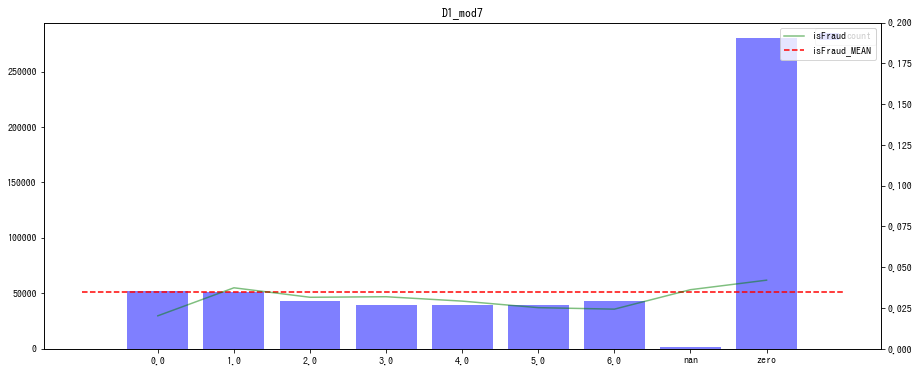

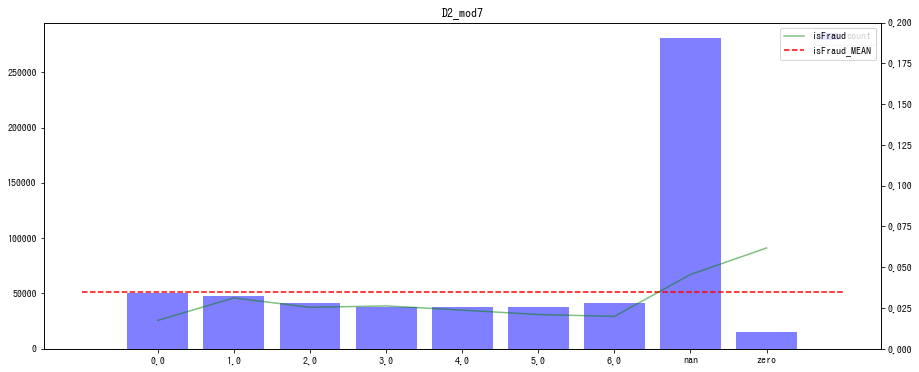

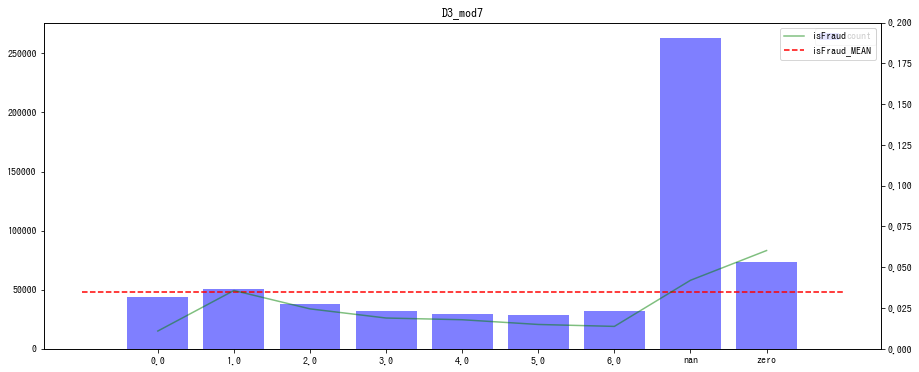

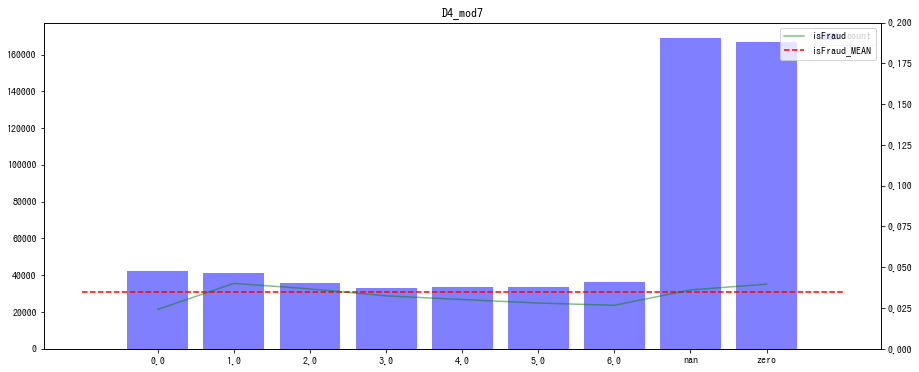

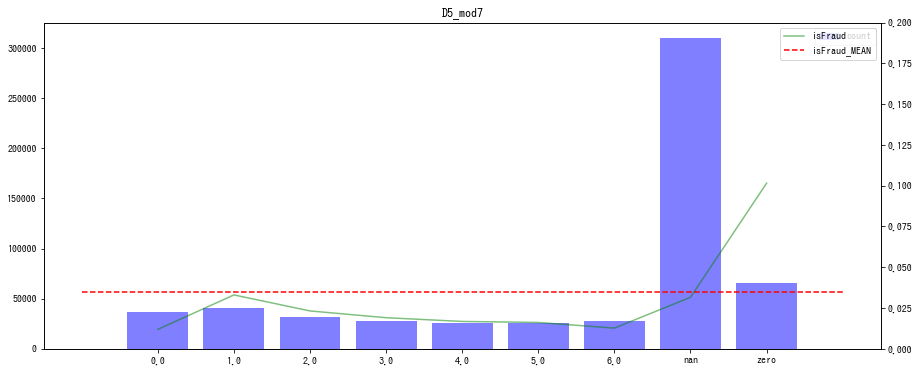

...

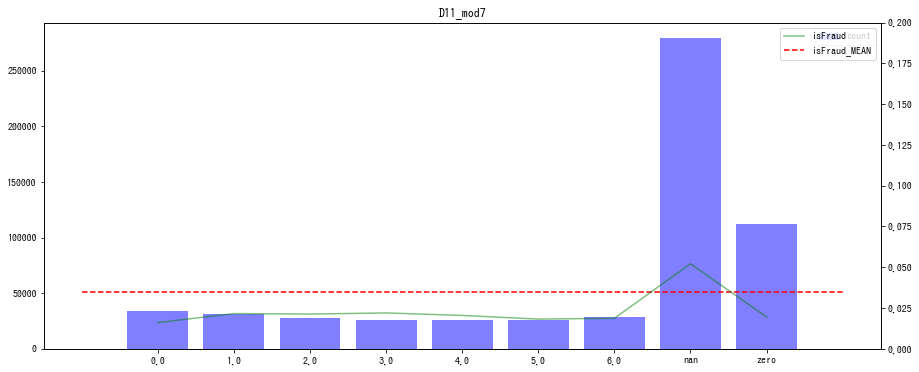

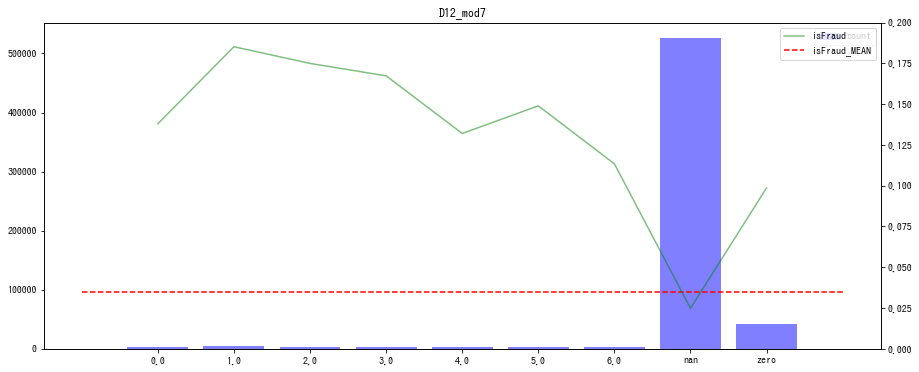

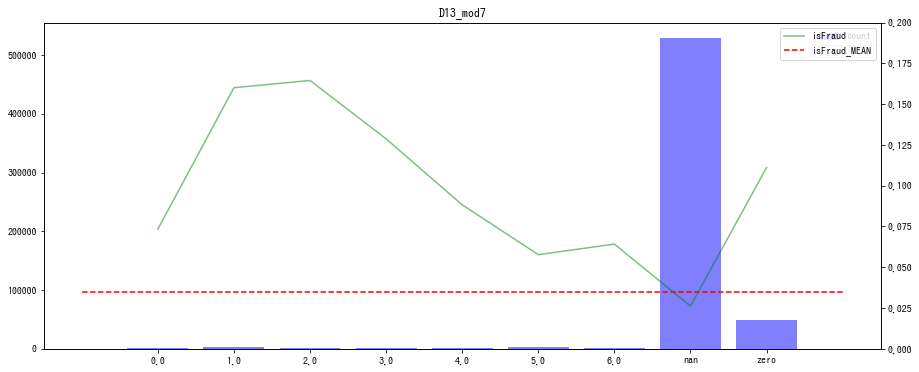

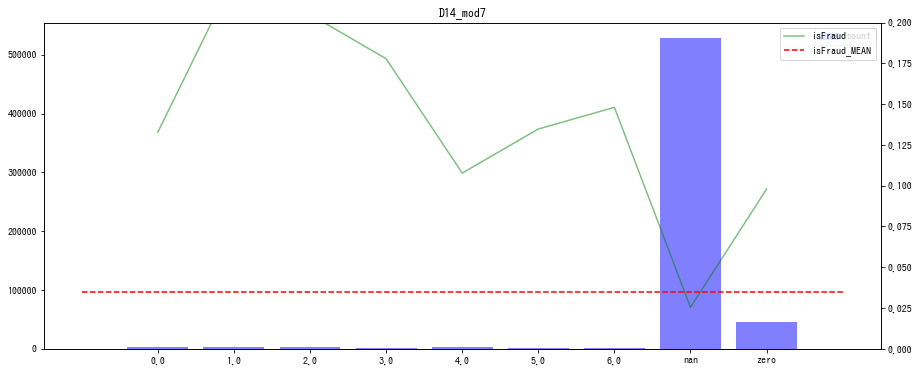

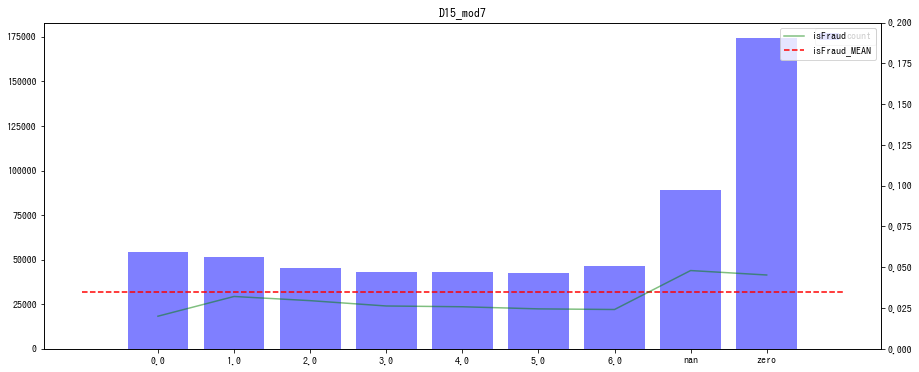

In [29]:
for col in df[["D{}".format(x) for x in range(1, 15+1)]]:
    fe_col = "{}_mod7".format(col)
    nan_idx = df[df[col].isnull()].index
    zero_idx = df[df[col] == 0].index
    df[fe_col] = (df[col].round(0) % 7)
    df[fe_col].iloc[zero_idx] = "zero"
    df[fe_col].iloc[nan_idx] = "nan"
    viz_count_mean(df, fe_col, save_path="datecol")

In [30]:
import seaborn as sns
from itertools import combinations

In [33]:
def viz_cross_agg(df, col1, col2):
    """
    2変数間のカウント、isFraudの平均を出す
    """
    fig, axs = plt.subplots(1, 2, figsize=(24, 8))
    sns.heatmap(pd.pivot_table(data=df, values="isFraud", columns=col1, index=col2, aggfunc=["count"]), 
                robust=True, annot=True, cmap="Reds", fmt="6g", ax=axs[0])
    sns.heatmap(pd.pivot_table(data=df, values="isFraud", columns=col1, index=col2, aggfunc=["mean"]), 
                robust=True, cmap="Reds", annot=True, fmt=".3f", ax=axs[1])
    axs[0].set_title("{} vs {} (count)".format(col1, col2))
    axs[1].set_title("{} vs {} (isFraud)".format(col1, col2))
    plt.show()

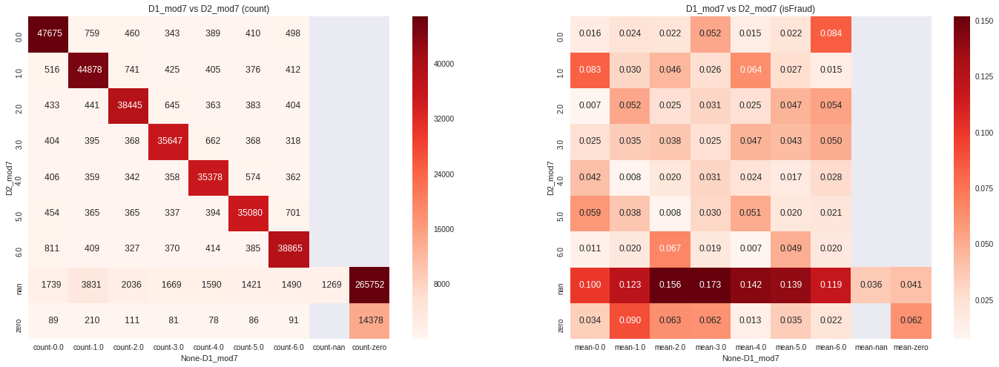

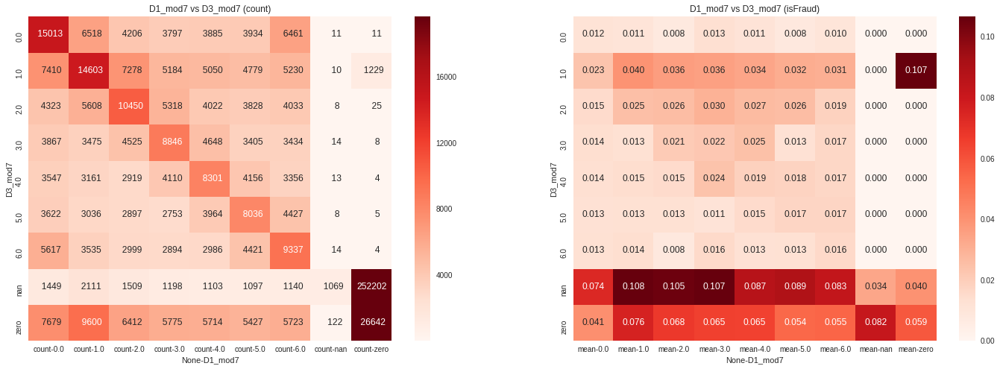

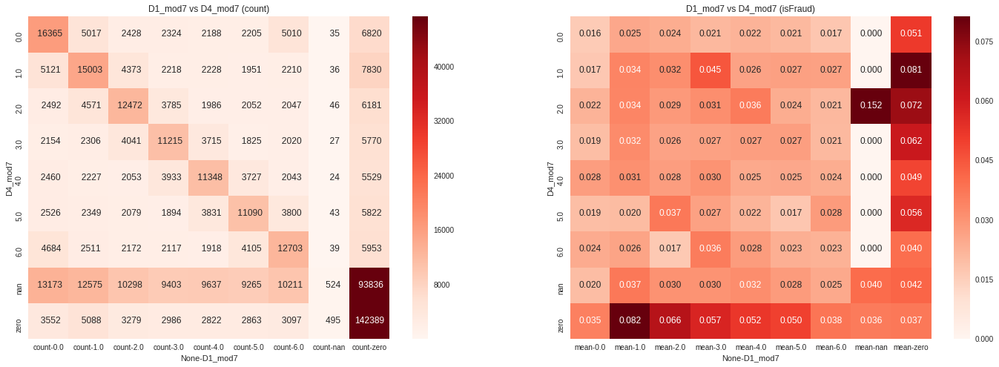

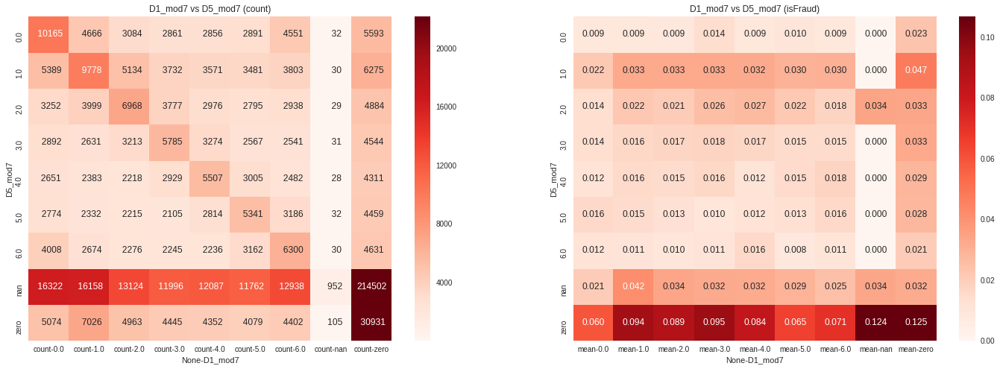

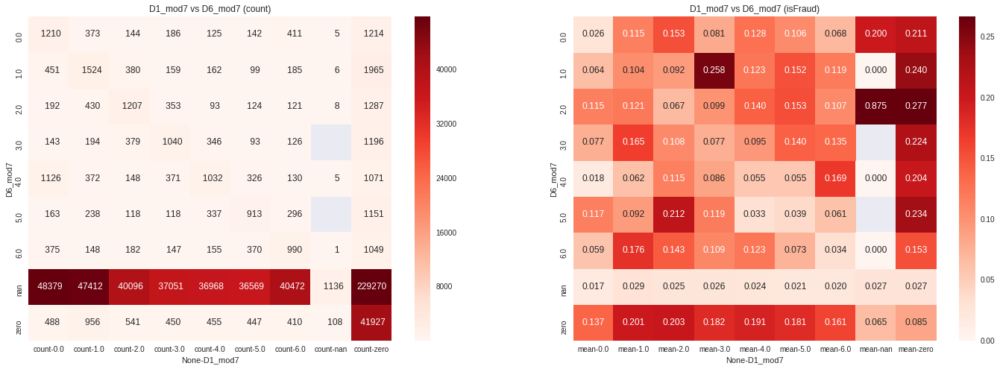

...

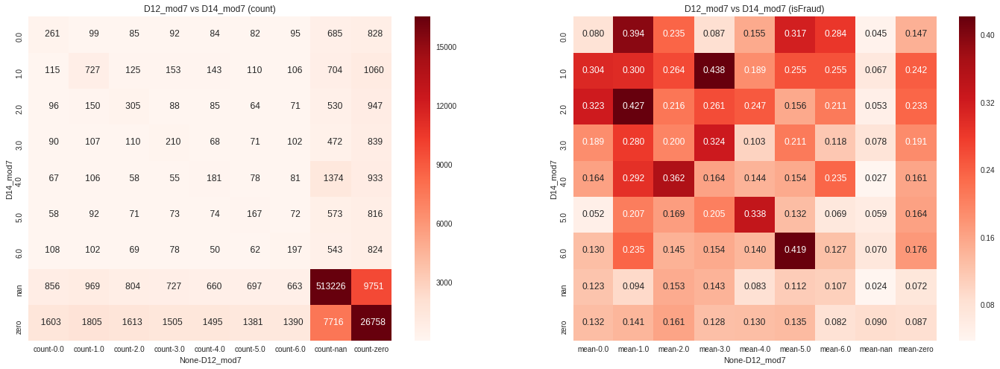

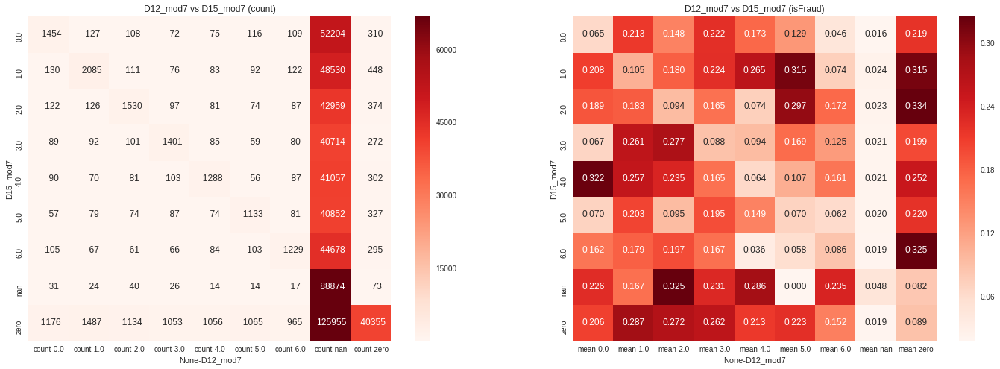

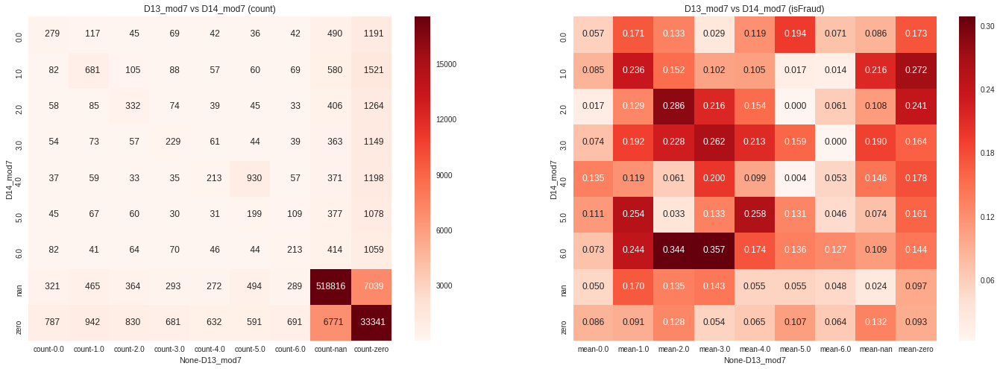

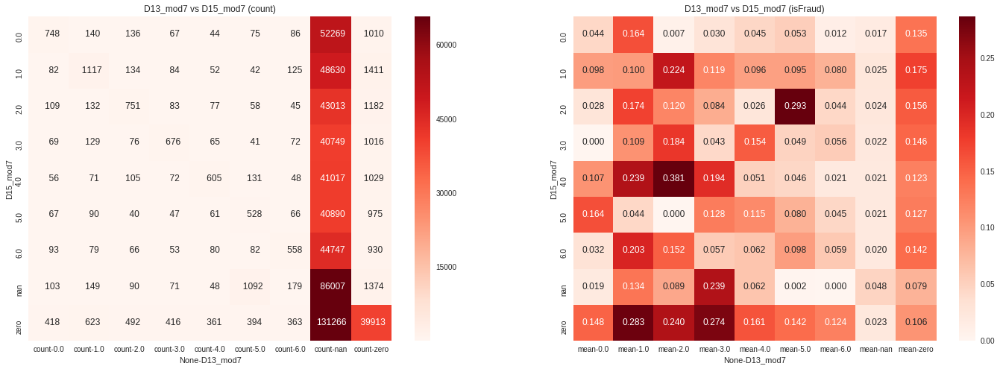

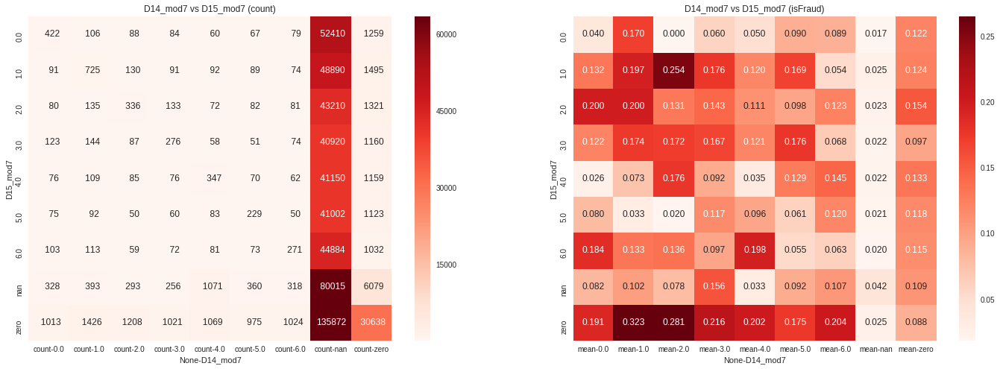

In [34]:
for indices in combinations(["D{}_mod7".format(x) for x in range(1, 15+1)], 2):
    viz_cross_agg(df, col1=indices[0], col2=indices[1])

In [42]:
df.query("D2_mod7 == D3_mod7 and D2_mod7 != 'nan'").head(500).to_csv("d2mod7-d3mod7.csv")

In [49]:
df["nunique"] = df[["D{}_mod7".format(x) for x in range(1, 15+1)]].nunique(axis=1)

In [55]:
df["isnan_sum"] = df[["D{}_mod7".format(x) for x in range(1, 15+1)]].replace("nan", np.nan).isnull().sum(axis=1)
df["iszero_sum"] = df[["D{}_mod7".format(x) for x in range(1, 15+1)]].replace("zero", np.nan).isnull().sum(axis=1)

In [77]:
df["D6-7-8_nancount"] = df[["D6", "D7", "D8"]].isnull().sum(axis=1)

In [82]:
df["D6-7-8_zerocount"] = (df[["D6", "D7", "D8"]] == 0).sum(axis=1)

In [67]:
df["mod0_mod1"] = (df[["D{}_mod7".format(x) for x in range(1, 15+1)]] == 0).sum(axis=1) + (df[["D{}_mod7".format(x) for x in range(1, 15+1)]] == 1).sum(axis=1)

# 知見ベースでいろいろ見る

In [68]:
df.groupby("isnan_sum").agg({"isFraud": ["count", "mean"]})

isFraud          
        count      mean
isnan                  
1        9011  0.051160
2        4989  0.184005
3        9811  0.241871
4        3816  0.243973
5       11741  0.099225
6        4164  0.109030
7      161591  0.024964
8       84201  0.026508
9       80356  0.022338
10      95349  0.018112
11      51194  0.031586
12      35535  0.050767
13      10267  0.045291
14      28467  0.023922
15         48  0.125000

In [69]:
df.groupby("iszero_sum").agg({"isFraud": ["count", "mean"]})

isFraud          
         count      mean
iszero                  
0       196014  0.017091
1       128793  0.030405
2        65829  0.043233
3        29461  0.047487
4        45106  0.036181
5        66709  0.028062
6        12567  0.097955
7        14978  0.084591
8        20785  0.062882
9         2316  0.360104
10        3142  0.230108
11        2305  0.070716
12        2398  0.048791
13          87  0.034483
14          50  0.060000

In [79]:
df.groupby("D6-7-8_nancount").agg({"isFraud": ["count", "mean"]})

isFraud          
                  count      mean
D6-7-8_nancount                  
0                 26010  0.167589
1                 20742  0.102787
2                 67516  0.059156
3                476272  0.021370

In [83]:
df.groupby("D6-7-8_zerocount").agg({"isFraud": ["count", "mean"]})

isFraud          
                   count      mean
D6-7-8_zerocount                  
0                 534721  0.026556
1                  44161  0.092774
2                  11383  0.202056
3                    275  0.240000

In [134]:
from sklearn.decomposition import PCA, TruncatedSVD

In [123]:
datemod_ary = []
for col in ["D{}_mod7".format(x) for x in range(1, 15 + 1)]:
    ary = []
    for val in ["0", "1", "2", "3", "4", "5", "6", "zero", "nan"]:
        ary.append((df[col] == val).astype(int).values)
    datemod_ary.append(ary)

datemod_ary = np.array(datemod_ary).reshape(-1, len(df)).transpose()

In [125]:
pca = PCA(n_components=5)

In [126]:
pca.fit(datemod_ary)

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [127]:
df["D_mod7_pca"] = pca.transform(datemod_ary)[:, 0]

In [133]:
df.groupby("isFraud").agg({"D_mod7_pca": ["mean", "std"]})

D_mod7_pca          
              mean       std
isFraud                     
0        -0.018149  1.070968
1         0.500544  1.144768

In [140]:
svd = TruncatedSVD(n_components=10)

In [141]:
svd.fit(datemod_ary)

TruncatedSVD(algorithm='randomized', n_components=10, n_iter=5,
             random_state=None, tol=0.0)

In [144]:
df["D_mod7_svd"] = svd.transform(datemod_ary)[:, 1]

In [145]:
svd.explained_variance_ratio_

array([0.10859995, 0.30635677, 0.18055954, 0.09984785, 0.06071066,
       0.05115816, 0.03201697, 0.02911789, 0.01923616, 0.01682502])

In [146]:
df.groupby("isFraud").agg({"D_mod7_svd": ["mean", "std"]})

D_mod7_svd          
              mean       std
isFraud                     
0        -0.064831  1.055921
1         0.553612  1.232161

In [147]:
pca.explained_variance_ratio_

array([0.31166458, 0.18582505, 0.16646645, 0.06107154, 0.05152787])